<h3>Галлямов Артур, КЭ-403, лабораторная работа №3</h3>

1. Разработайте программу, которая выполняет классификацию заданного набора данных с помощью дерева решений. Параметрами программы являются набор данных, критерий выбора атрибута разбиения (Information gain, Gain ratio, Gini index).
2. Проведите эксперименты на наборе Census Income (данные о результатах переписи населения, в т.ч. о годовом доходе -- ниже или выше $50000: скачать обучающую выборку в формате CSV, тестовую выборку в формате CSV, скачать описание). В качестве обучающей выборки для построения дерева используйте 100% исходных данных.
3. Выполните визуализацию построенных деревьев решений.
4. Доработайте программу, добавив в список ее параметров долю, которую занимает обучающая выборка от общего размера набора данных, и обеспечив вычисление и выдачу в качестве результатов следующих показателей качества классификации: аккуратность (accuracy), точность (precision), полнота (recall), F-мера.
5. Проведите эксперименты на наборе данных, фиксируя критерий выбора атрибута разбиения и варьируя соотношение мощностей обучающей и тестовой выборок от 60%:40% до 90%:10% с шагом 10%.
6. Выполните визуализацию полученных результатов в виде следующих диаграмм:
* построенные деревья решений для заданного набора данных;
* показатели качества классификации в зависимости от соотношения мощностей обучающей и тестовой выборок для заданного набора данных.
7. Подготовьте отчет о выполнении задания и загрузите отчет в формате PDF в систему. Отчет должен представлять собой связный и структурированный документ со следующими разделами:  
* формулировка задания; 
* гиперссылка на каталог репозитория с исходными текстами, наборами данных и др. сопутствующими материалами; 
* рисунки с результатами визуализации; 
* пояснения, раскрывающие смысл полученных результатов.

<h3>Импорт необходимых библиотек</h3>

In [57]:
import pandas as pd
import numpy as np
import graphviz
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, precision_score
from sklearn.model_selection import train_test_split
from sklearn.tree import export_graphviz

<h3>Чтение датасетов и их объединение</h3>

In [58]:
train = pd.read_csv('train.csv', header=None)
test = pd.read_csv('test.csv', header=None)

column_names = {
    0: "age",
    1: "workclass",
    2: "fnlwgt",
    3: "education",
    4: "education-num",
    5: "marital-status",
    6: "occupation",
    7: "relationship",
    8: "race",
    9: "sex",
    10: "capital-gain",
    11: "capital-loss",
    12: "hours-per-week",
    13: "native-country",
    14: "income"
}

train.rename(columns=column_names, inplace=True)
test.rename(columns=column_names, inplace=True)
test['income'] = test['income'].str.rstrip('.')

dataset = pd.concat([train, test])
dataset

,age,workclass,fnlwgt,education,education-num,marital-status,occupation,relationship,race,sex,capital-gain,capital-loss,hours-per-week,native-country,income
0,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
1,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
2,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
3,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
4,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16276,39,Private,215419,Bachelors,13,Divorced,Prof-specialty,Not-in-family,White,Female,0,0,36,United-States,<=50K
16277,64,?,321403,HS-grad,9,Widowed,?,Other-relative,Black,Male,0,0,40,United-States,<=50K
16278,38,Private,374983,Bachelors,13,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,50,United-States,<=50K
16279,44,Private,83891,Bachelors,13,Divorced,Adm-clerical,Own-child,Asian-Pac-Islander,Male,5455,0,40,United-States,<=50K


<h3>Программа классификации с помощью дерева решения</h3>

In [59]:
# метрики классификации
def classification_metrics(y_true, y_pred):
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, pos_label=1)

    return accuracy, precision

# обучения дерева решений
def classify_dataset(dataset, criterion, test_size=0.2):    
    # преобразование категориальных признаков в числовые с помощью LabelEncoder
    dataset_encoded = dataset.copy()
    label_encoder = LabelEncoder()
    for column in dataset_encoded.select_dtypes(include=['object']).columns:
        dataset_encoded[column] = label_encoder.fit_transform(dataset_encoded[column])

    # разделение на признаки и метки
    x = dataset_encoded.drop(columns=['income'])
    y = dataset_encoded['income']

    # разделение на обучающий и тестовый наборы
    X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=test_size, random_state=42)

    # создание и обучение модели дерева решений
    model = DecisionTreeClassifier(criterion=criterion, max_depth=15, random_state=42)
    model.fit(X_train, y_train)

    # предсказание на тестовом наборе
    y_pred = model.predict(X_test)

    # вычисление показателей качества классификации
    accuracy, precision = classification_metrics(y_test, y_pred)

    return model, accuracy, precision, X_train, y_train


In [60]:
criterion = 'gini'
test_size = 0.2

model, accuracy, precision, X_train, y_train = classify_dataset(dataset, criterion, test_size)

print(f"Метрики с критерием {criterion}:\n" +
        f"Accuracy: {accuracy:.2f}\n" +
        f"Precision: {precision:.2f}"
      )

Метрики с критерием gini:
Accuracy: 0.85
Precision: 0.72


<h3>Визуализация дерева решений</h3>

In [61]:
def visualize_tree(model, feature_names, class_names):
    dot_data = export_graphviz(model, 
                               feature_names=feature_names,  
                               class_names=class_names,  
                               filled=True, rounded=True,  
                               )  
    return graphviz.Source(dot_data, format="png")

model, accuracy, precision, X_train, y_train = classify_dataset(dataset, 'gini')
feature_names = X_train.columns
class_names = ['<=50K', '>50K']
visualize_tree(model, feature_names, class_names)

<h3>Эксперименты на наборе данных, фиксируя критерий выбора атрибута разбиения и вариацией соотношения мощностей обучающей и тестовой выборок</h3>

In [62]:
train_test_ratios = np.arange(0.6, 0.91, 0.1)

criteria = ['gini', 'entropy']

results = {}

for criterion in criteria:
    results[criterion] = {'train_test_ratio': [], 'accuracy': [], 'precision': []}
    
    # Проходим по всем долям обучающей выборки
    for train_test_ratio in train_test_ratios:
        # Классификация набора данных с заданным критерием и долей обучающей выборки
        model, accuracy, precision, _, _ = classify_dataset(dataset, criterion, test_size=1 - train_test_ratio)
        
        results[criterion]['train_test_ratio'].append(train_test_ratio)
        results[criterion]['accuracy'].append(accuracy)
        results[criterion]['precision'].append(precision)

# Вывод результатов
for criterion in criteria:
    print(f"Результаты для критерия '{criterion}':")
    print("Доля обучающей выборки  | Accuracy | Precision")
    for i in range(len(train_test_ratios)):
        print(f"{results[criterion]['train_test_ratio'][i]:<23.2f} | "
              f"{results[criterion]['accuracy'][i]:<8.2f} | "
              f"{results[criterion]['precision'][i]:<9.2f}")
    print("\n")

Результаты для критерия 'gini':
Доля обучающей выборки  | Accuracy | Precision
0.60                    | 0.84     | 0.69     
0.70                    | 0.84     | 0.70     
0.80                    | 0.85     | 0.72     
0.90                    | 0.84     | 0.69     


Результаты для критерия 'entropy':
Доля обучающей выборки  | Accuracy | Precision
0.60                    | 0.84     | 0.71     
0.70                    | 0.85     | 0.74     
0.80                    | 0.85     | 0.74     
0.90                    | 0.84     | 0.72     




<h3>Визуализация деревьев решения с разными долями тестовой выборки</h3>

In [63]:
model, accuracy, precision, X_train, y_train = classify_dataset(dataset, 'gini', test_size=0.6)
feature_names = X_train.columns
class_names = ['<=50K', '>50K']
visualize_tree(model, feature_names, class_names)

In [64]:
model, accuracy, precision, X_train, y_train = classify_dataset(dataset, 'gini', test_size=0.7)
feature_names = X_train.columns
class_names = ['<=50K', '>50K']
visualize_tree(model, feature_names, class_names)

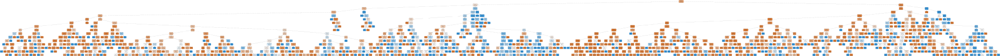

In [65]:
model, accuracy, precision, X_train, y_train = classify_dataset(dataset, 'gini', test_size=0.8)
feature_names = X_train.columns
class_names = ['<=50K', '>50K']
visualize_tree(model, feature_names, class_names)

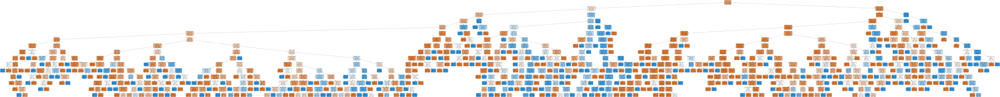

In [66]:
model, accuracy, precision, X_train, y_train = classify_dataset(dataset, 'gini', test_size=0.9)
feature_names = X_train.columns
class_names = ['<=50K', '>50K']
visualize_tree(model, feature_names, class_names)

<h3>Показатели качества классификации в зависимости от соотношения мощностей обучающей и тестовой выборок для заданного набора данных</h3>

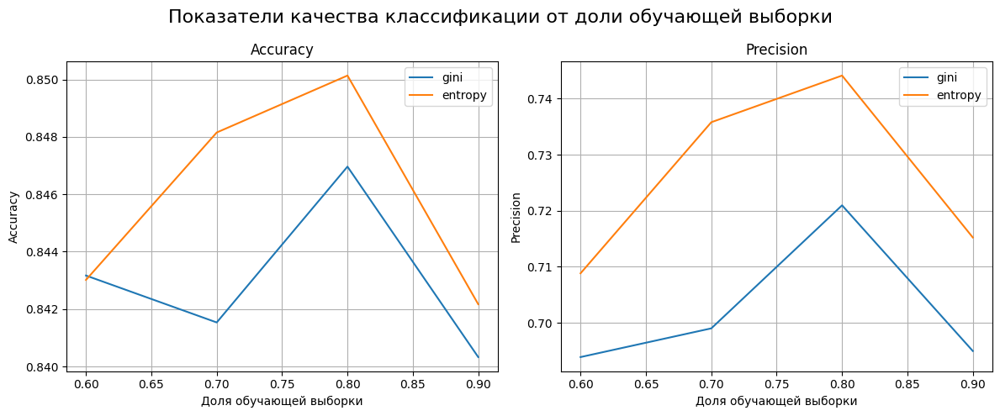

In [67]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 5))
axes = axes.flatten()
metrics = ['accuracy', 'precision']
metric_names = ['Accuracy', 'Precision']

for i, metric in enumerate(metrics):
    for criterion in criteria:
        axes[i].plot(results[criterion]['train_test_ratio'], results[criterion][metric], label=criterion)
    
    axes[i].set_title(metric_names[i])
    axes[i].set_xlabel('Доля обучающей выборки')
    axes[i].set_ylabel(metric_names[i])
    axes[i].legend()
    axes[i].grid(True)

fig.suptitle('Показатели качества классификации от доли обучающей выборки', fontsize=16)
plt.tight_layout()
plt.show()